## Model partition calibration example

In [1]:
%matplotlib inline

import sys

from data_models.parameters import arl_path

import numpy

from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy import constants as const
from astropy.wcs.utils import pixel_to_skycoord

from matplotlib import pyplot as plt
from matplotlib import pylab as pylab

from data_models.memory_data_models import SkyModel
from data_models.polarisation import PolarisationFrame

from processing_library.util.coordinate_support import simulate_point, skycoord_to_lmn

from wrappers.serial.calibration.calibration_control import calibrate_function, create_calibration_controls
from wrappers.serial.skycomponent.operations import find_skycomponents, partition_skycomponent_neighbours

from wrappers.serial.visibility.base import create_blockvisibility, copy_visibility
from processing_library.image.operations import copy_image
from wrappers.serial.image.operations import show_image, qa_image
from wrappers.serial.simulation.testing_support import create_named_configuration, \
    create_low_test_skycomponents_from_gleam, create_unittest_components
from wrappers.serial.skycomponent.operations import filter_skycomponents_by_flux
from wrappers.serial.simulation.mpc import create_gaintable_from_screen, sum_visibility_over_partitions, \
    calculate_sf_from_screen
from wrappers.serial.skymodel.operations import show_skymodel

from processing_components.simulation.mpc import expand_skymodel_by_skycomponents

from wrappers.serial.imaging.primary_beams import create_low_test_beam
from wrappers.serial.skycomponent.operations import apply_beam_to_skycomponent
from wrappers.serial.imaging.base import create_image_from_visibility, advise_wide_field
from wrappers.serial.image.operations import import_image_from_fits, export_image_to_fits

from wrappers.arlexecute.visibility.coalesce import convert_blockvisibility_to_visibility
from wrappers.arlexecute.skycomponent.operations import insert_skycomponent
from wrappers.arlexecute.image.operations import smooth_image, show_components

from workflows.arlexecute.pipelines.pipeline_arlexecute import continuum_imaging_list_arlexecute_workflow, \
    ical_list_arlexecute_workflow
from workflows.serial.imaging.imaging_serial import invert_list_serial_workflow
from workflows.serial.imaging.imaging_serial import weight_list_serial_workflow, taper_list_serial_workflow
from workflows.serial.pipelines.pipeline_serial import continuum_imaging_list_serial_workflow, \
    ical_list_serial_workflow
from data_models.data_model_helpers import import_skycomponent_from_hdf5, import_gaintable_from_hdf5

from data_models.data_model_helpers import import_skymodel_from_hdf5
from workflows.arlexecute.imaging.imaging_arlexecute import invert_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import predict_skymodel_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import extract_datamodels_skymodel_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import invert_skymodel_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import convolve_skymodel_list_arlexecute_workflow
from wrappers.arlexecute.skymodel.operations import calculate_skymodel_equivalent_image, \
    update_skymodel_from_image, update_skymodel_from_gaintables
from workflows.arlexecute.imaging.imaging_arlexecute import deconvolve_list_arlexecute_workflow
from data_models.data_model_helpers import export_skymodel_to_hdf5
from workflows.arlexecute.calibration.calibration_arlexecute import calibrate_list_arlexecute_workflow

from data_models.data_model_helpers import import_blockvisibility_from_hdf5

from wrappers.arlexecute.execution_support.arlexecute import arlexecute
from wrappers.arlexecute.execution_support.dask_init import get_dask_Client

In [2]:
import logging
def init_logging():
    logging.basicConfig(filename='results/low-sims-mpc.log',
                        filemode='a',
                        format='%(asctime)s,%(msecs)d %(name)s %(levelname)s %(message)s',
                        datefmt='%H:%M:%S',
                        level=logging.DEBUG)

init_logging()
log = logging.getLogger()
    
def lprint(*args):
    log.info(*args)
    print(*args)

In [3]:
pylab.rcParams['figure.figsize'] = (14.0, 14.0)
pylab.rcParams['image.cmap'] = 'rainbow'

In [4]:
c = get_dask_Client(memory_limit=48 * 1024 * 1024 * 1024, n_workers=16)
arlexecute.set_client(c)
arlexecute.run(init_logging)

Creating LocalCluster and Dask Client
Diagnostic pages available on port http://127.0.0.1:8787


{'tcp://127.0.0.1:33347': None,
 'tcp://127.0.0.1:34091': None,
 'tcp://127.0.0.1:34549': None,
 'tcp://127.0.0.1:34635': None,
 'tcp://127.0.0.1:34923': None,
 'tcp://127.0.0.1:36711': None,
 'tcp://127.0.0.1:37795': None,
 'tcp://127.0.0.1:37923': None,
 'tcp://127.0.0.1:38649': None,
 'tcp://127.0.0.1:39077': None,
 'tcp://127.0.0.1:39647': None,
 'tcp://127.0.0.1:42699': None,
 'tcp://127.0.0.1:43523': None,
 'tcp://127.0.0.1:44461': None,
 'tcp://127.0.0.1:45139': None,
 'tcp://127.0.0.1:46401': None}

### Read the previously prepared observation

In [5]:
blockvis = import_blockvisibility_from_hdf5('results/low-sims-mpc-skymodel-noniso-blockvis_rmax10000.0.hdf5')
Vobs = convert_blockvisibility_to_visibility(blockvis)

### Initialization phase

#### Read the previous iteration of skymodels, $\theta_p^{(n)}$. Each skymodel will contain a mask based on the decomposition, an image and gaintable derived from ICAL

/home/timcornwell/anaconda3/envs/arl/lib/python3.6/site-packages/distributed/worker.py:901: UserWarning: Large object of size 134.22 MB detected in task graph: 
  ('getitem-44d0aebfb173d4ecc114cb8a0d544101', <data ... -6d0812a173be')
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  % (format_bytes(len(b)), s))


arlexecute.compute: Execution using Dask took 10.877 seconds
Iteration 1
arlexecute.compute: Execution using Dask took 50.050 seconds
arlexecute.compute: Execution using Dask took 39.859 seconds
arlexecute.compute: Execution using Dask took 45.555 seconds
Peak residual : 0.5469001644904612
arlexecute.compute: Execution using Dask took 7.066 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.7559436239006437'
		min: '-0.02968001538979968'
		rms: '0.00018816930989650456'
		sum: '0.21379358108433516'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.050 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.01579983650470927'
		min: '-0.003461038177394223'
		rms: '1.6624349406184536e-05'
		sum: '0.6705638527949689'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.965 seconds
Quality assessment:
	Origi

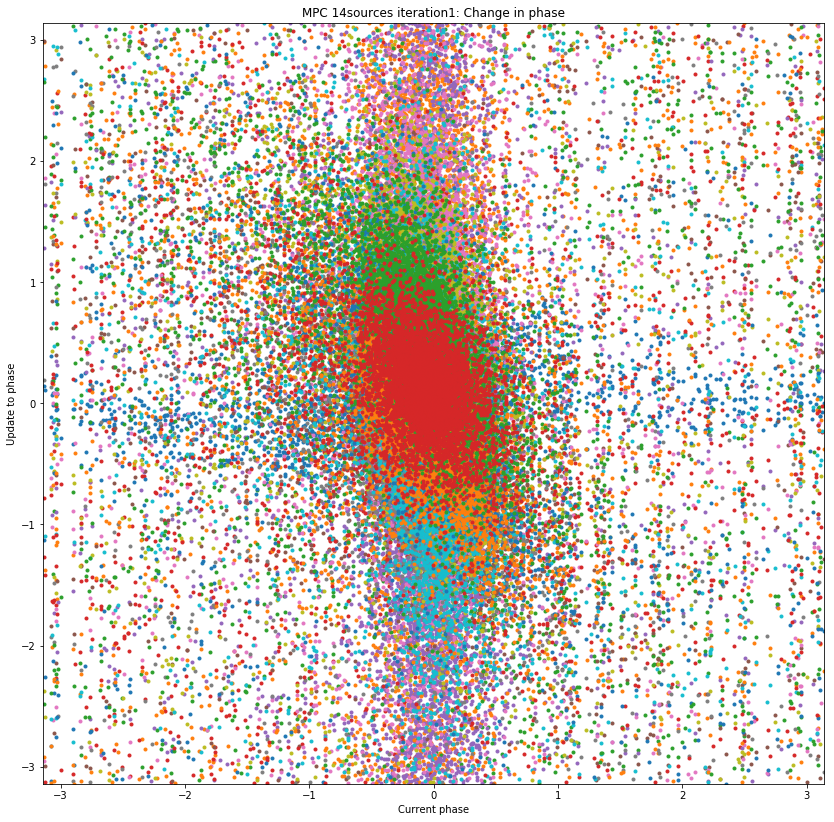

Iteration 2
arlexecute.compute: Execution using Dask took 47.496 seconds
arlexecute.compute: Execution using Dask took 41.340 seconds
arlexecute.compute: Execution using Dask took 45.787 seconds
Peak residual : 1.4479336821590374
arlexecute.compute: Execution using Dask took 6.817 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '0.0'
		rms: '0.0'
		sum: '0.0'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 4.292 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.2072109999181862'
		min: '0.0'
		rms: '5.1274808931149534e-05'
		sum: '0.27667582114753836'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.601 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.2871407910247573'
		min: '0.0'
		rms: '7.361412400441583e-05'
		su

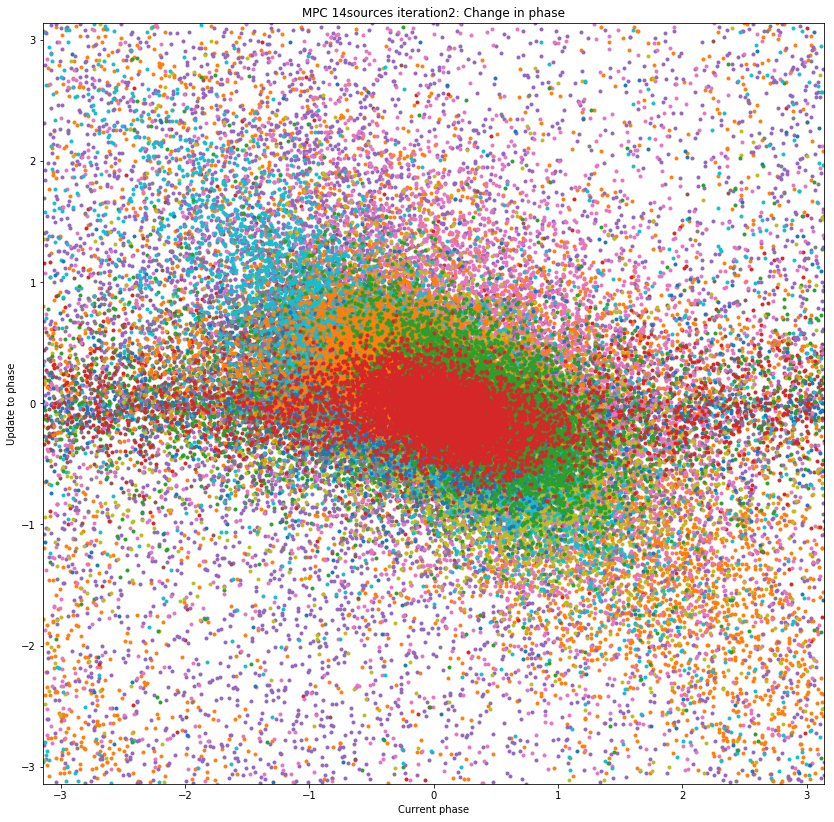

Iteration 3
arlexecute.compute: Execution using Dask took 47.589 seconds
arlexecute.compute: Execution using Dask took 41.386 seconds
arlexecute.compute: Execution using Dask took 45.556 seconds
Peak residual : 0.7802835748335322
arlexecute.compute: Execution using Dask took 6.998 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.2119635948989632'
		min: '0.0'
		rms: '5.174892299364118e-05'
		sum: '0.2119635948989632'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.719 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.29950987226119963'
		min: '0.0'
		rms: '7.31858228691974e-05'
		sum: '0.3247949131151243'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.947 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.44094337810608375'
	

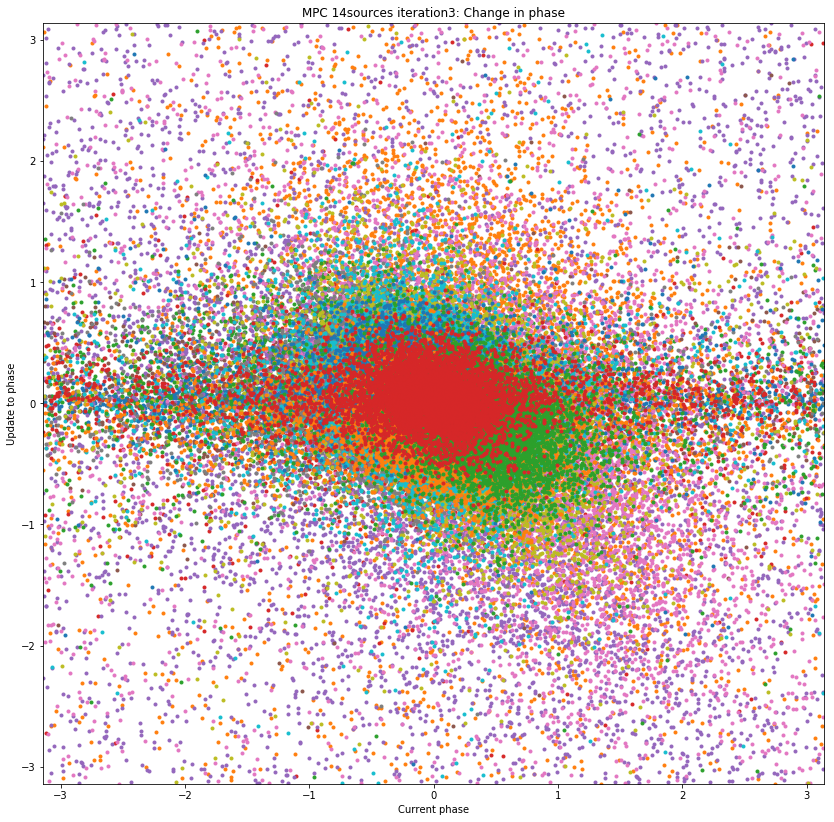

Iteration 4
arlexecute.compute: Execution using Dask took 47.555 seconds
arlexecute.compute: Execution using Dask took 41.192 seconds
arlexecute.compute: Execution using Dask took 45.645 seconds
Peak residual : 0.6968925009493709
arlexecute.compute: Execution using Dask took 7.065 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '0.0'
		rms: '0.0'
		sum: '0.0'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.944 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.022553752285068833'
		rms: '2.1791678448820353e-05'
		sum: '-0.7497494924184688'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.684 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.009598511909700444'
		rms: '8.710328111299398e-06

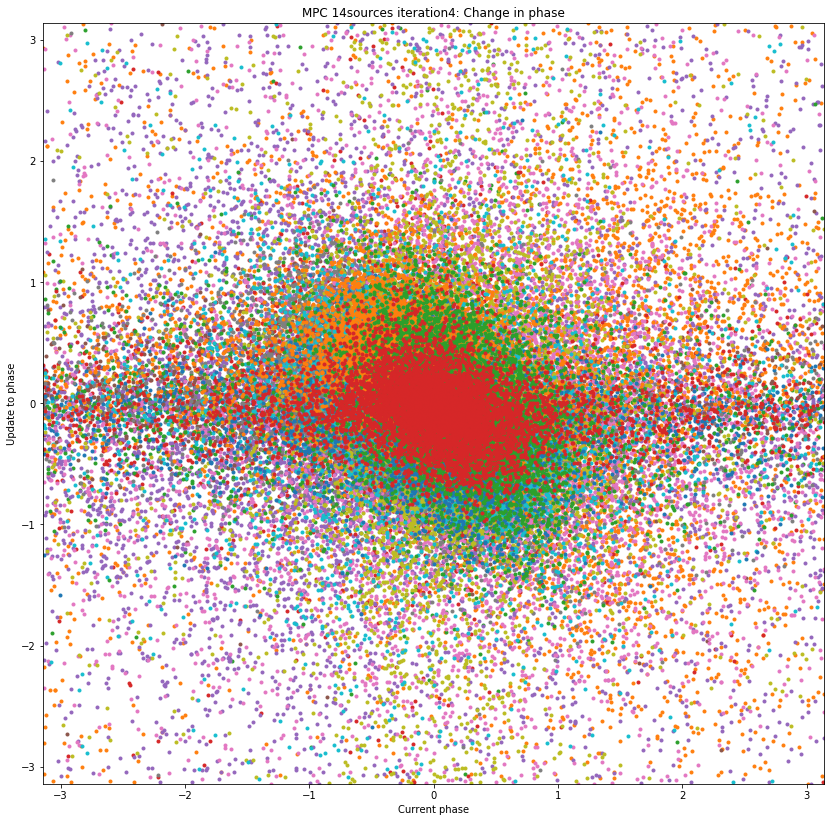

Iteration 5
arlexecute.compute: Execution using Dask took 47.602 seconds
arlexecute.compute: Execution using Dask took 40.990 seconds
arlexecute.compute: Execution using Dask took 45.322 seconds
Peak residual : 0.41976344105053043
arlexecute.compute: Execution using Dask took 5.073 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.16337464094124504'
		min: '-0.0477688903985885'
		rms: '4.3575519985971004e-05'
		sum: '-0.10901971306830499'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.692 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0685323820307084'
		rms: '1.674411662098907e-05'
		sum: '-0.07392394966564654'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 4.030 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4096, 4096)'
		max:

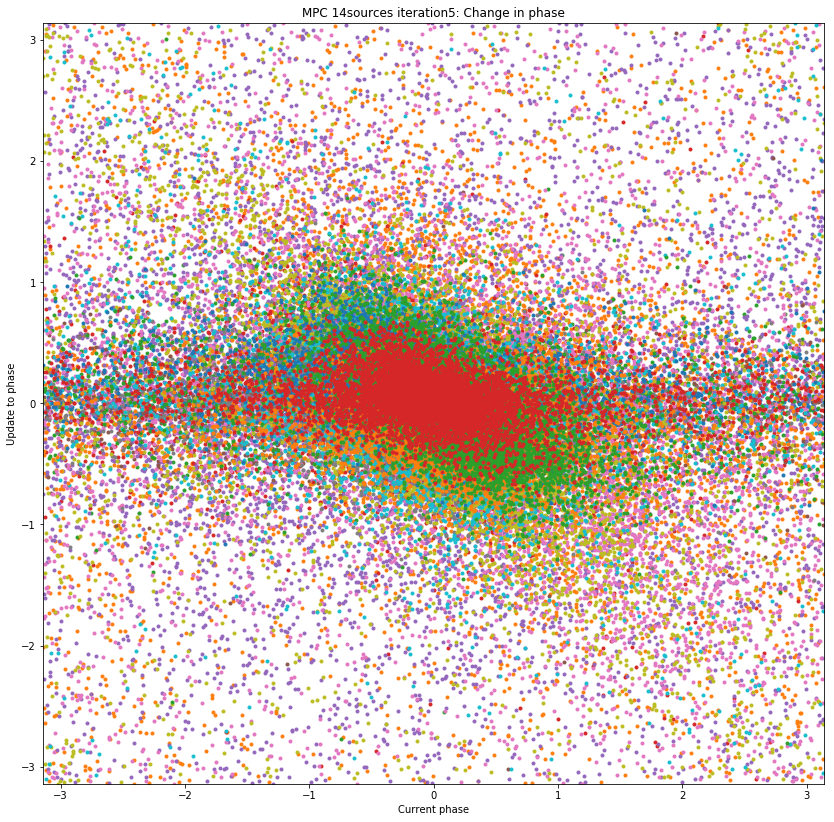

Iteration 6
arlexecute.compute: Execution using Dask took 46.770 seconds
arlexecute.compute: Execution using Dask took 40.954 seconds
arlexecute.compute: Execution using Dask took 45.410 seconds
Peak residual : 0.20176602801298538
arlexecute.compute: Execution using Dask took 8.694 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.10877103004328345'
		min: '-0.050562672524737035'
		rms: '4.213275235173284e-05'
		sum: '1.4250304426698137'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.563 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.008908606074792524'
		min: '-0.013655327066072307'
		rms: '1.2164217154024965e-05'
		sum: '0.131041286828752'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.374 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 409

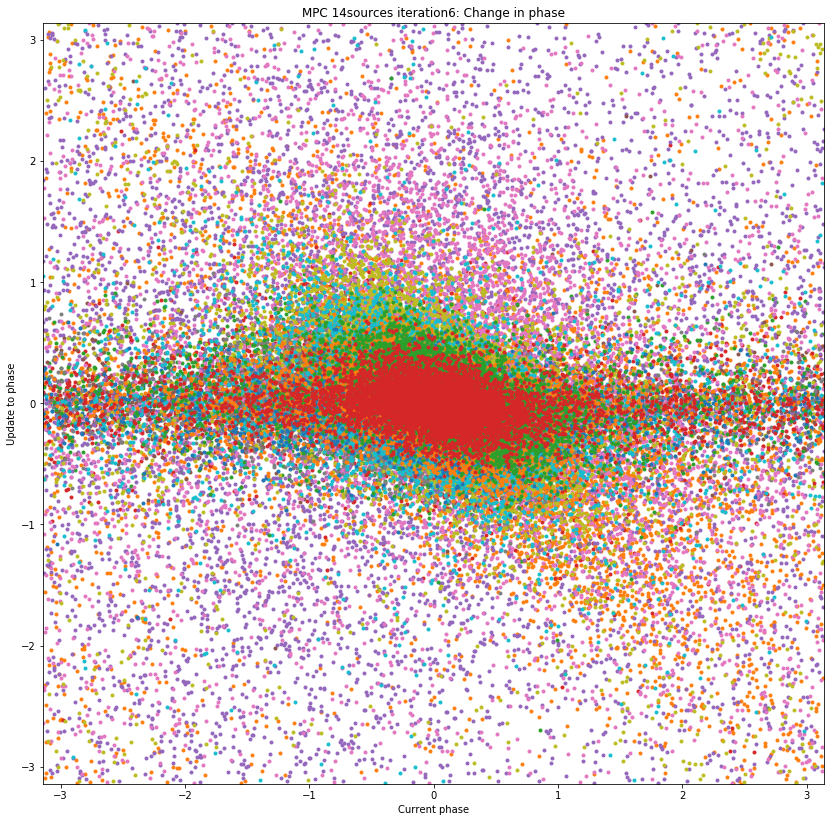

Iteration 7
arlexecute.compute: Execution using Dask took 47.652 seconds
arlexecute.compute: Execution using Dask took 40.816 seconds
arlexecute.compute: Execution using Dask took 45.342 seconds
Peak residual : 0.20299788524770968
arlexecute.compute: Execution using Dask took 7.600 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.1036558733806819'
		min: '-0.039400889239144324'
		rms: '3.1486864620560074e-05'
		sum: '0.07153394131934816'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.112 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00542172864526189'
		min: '-0.0013008001066694675'
		rms: '2.587622214615751e-06'
		sum: '0.08772427417561465'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.262 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4

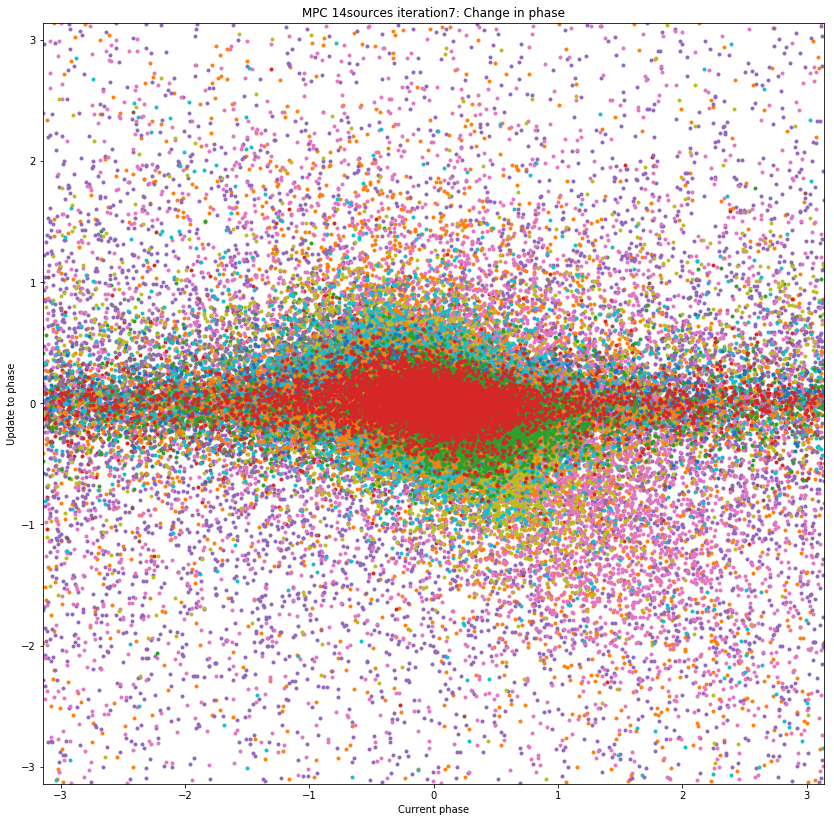

Iteration 8
arlexecute.compute: Execution using Dask took 47.693 seconds
arlexecute.compute: Execution using Dask took 40.658 seconds
arlexecute.compute: Execution using Dask took 45.539 seconds
Peak residual : 0.13272326968141968
arlexecute.compute: Execution using Dask took 8.127 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.017970912869836677'
		min: '-0.02508557805919741'
		rms: '2.7031246850533208e-05'
		sum: '0.22105002618053607'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.858 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.01424291339196443'
		min: '-0.018104750550034326'
		rms: '1.9684240002297407e-05'
		sum: '0.5195011569884957'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.422 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4

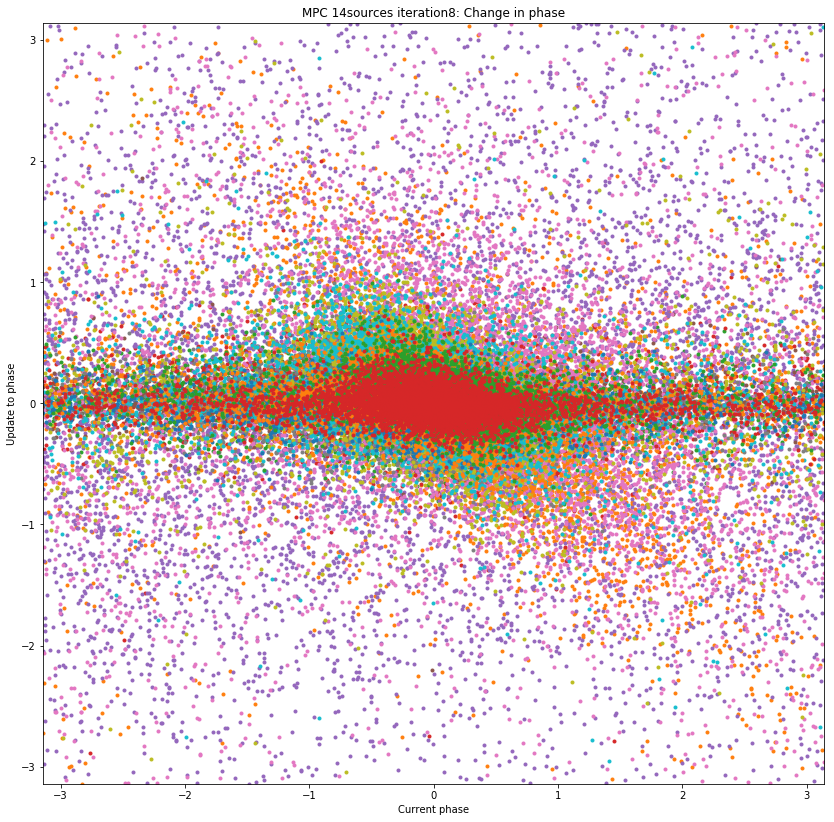

Iteration 9
arlexecute.compute: Execution using Dask took 47.355 seconds
arlexecute.compute: Execution using Dask took 41.072 seconds
arlexecute.compute: Execution using Dask took 45.486 seconds
Peak residual : 0.23415352707300913
arlexecute.compute: Execution using Dask took 6.791 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.034842189005387394'
		min: '-0.011979290354311814'
		rms: '9.008097300372026e-06'
		sum: '0.018846995715201858'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.663 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.011974121833324776'
		min: '0.0'
		rms: '3.5217845384907136e-06'
		sum: '0.02961041488619945'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.786 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4096, 4096)'
		m

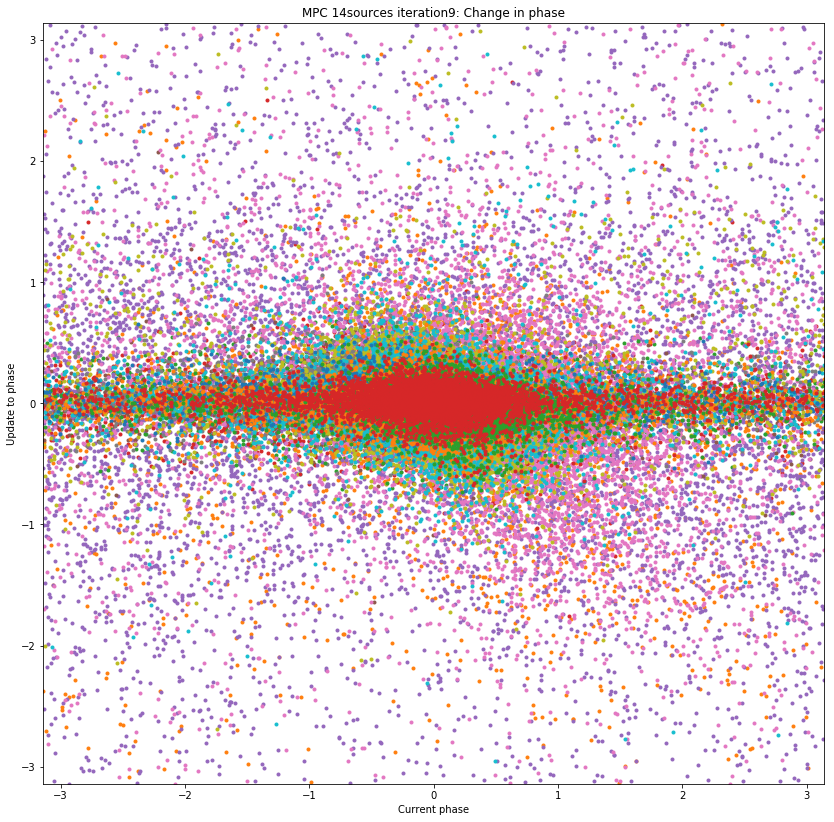

Iteration 10
arlexecute.compute: Execution using Dask took 47.242 seconds
arlexecute.compute: Execution using Dask took 40.636 seconds
arlexecute.compute: Execution using Dask took 45.718 seconds
Peak residual : 0.17448548689263188
arlexecute.compute: Execution using Dask took 6.828 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00512491920121201'
		min: '-0.007712422450539571'
		rms: '2.8387399055587875e-06'
		sum: '-0.007587522686045894'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.862 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001070160966527311'
		min: '0.0'
		rms: '7.225706431401547e-07'
		sum: '0.015443138175385547'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.740 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 4096, 4096)'
	

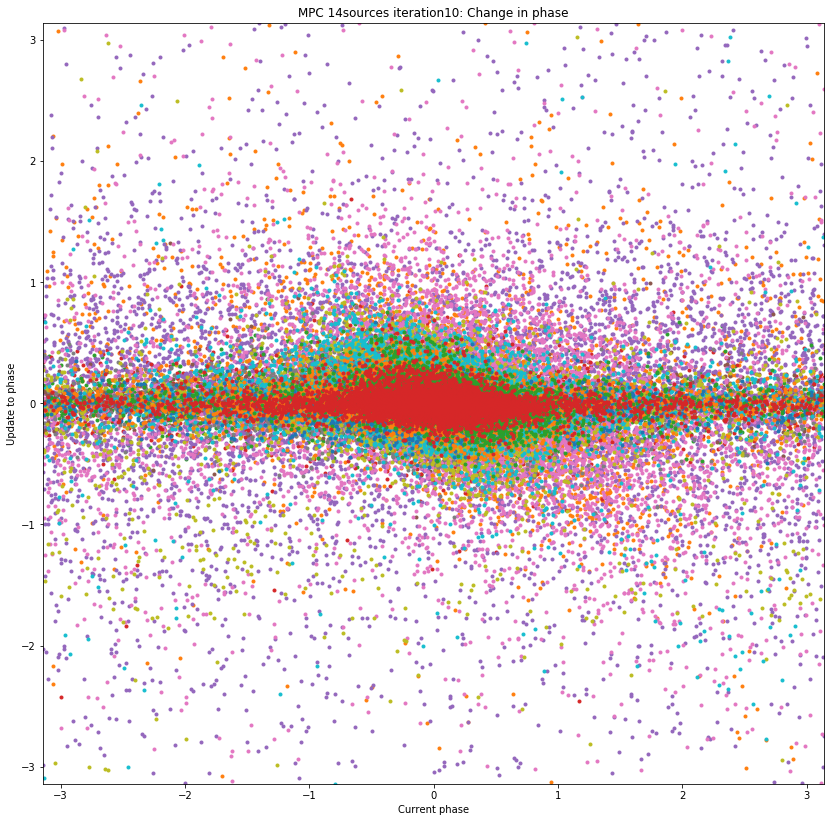

Iteration 11
arlexecute.compute: Execution using Dask took 47.413 seconds
arlexecute.compute: Execution using Dask took 41.137 seconds
arlexecute.compute: Execution using Dask took 45.798 seconds
Peak residual : 0.12154563275958119
arlexecute.compute: Execution using Dask took 8.123 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.040147443461037664'
		min: '-0.013375197107782628'
		rms: '2.160435327697822e-05'
		sum: '0.14980210729398633'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.696 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.016383232883831696'
		min: '-0.021824483143487543'
		rms: '1.8153539525750726e-05'
		sum: '0.4519168065760774'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.474 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1,

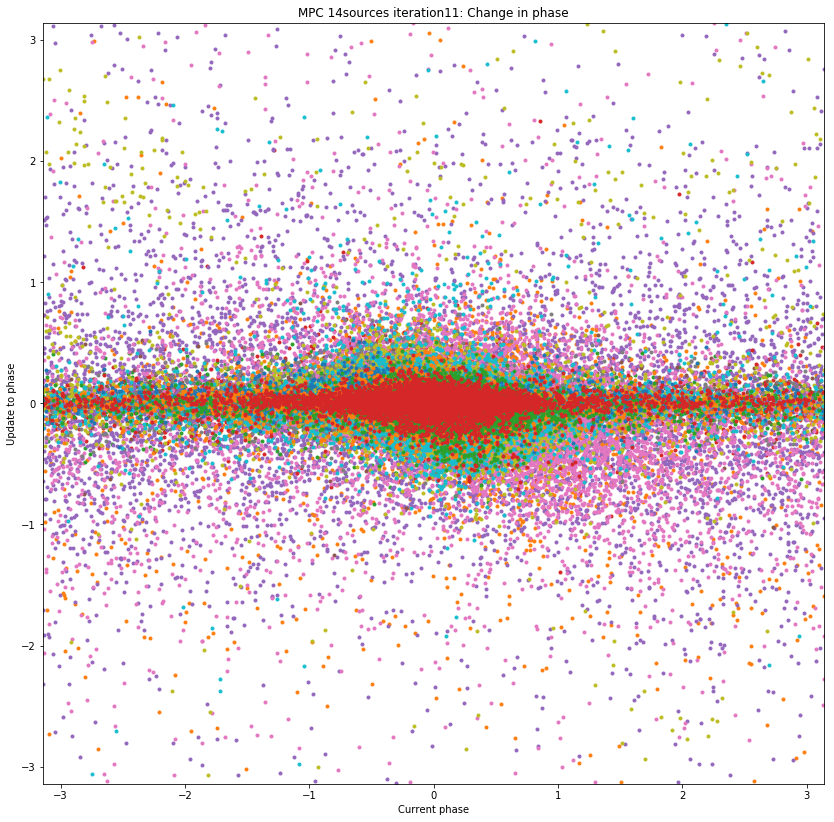

Iteration 12
arlexecute.compute: Execution using Dask took 47.493 seconds
arlexecute.compute: Execution using Dask took 40.749 seconds
arlexecute.compute: Execution using Dask took 46.011 seconds
Peak residual : 0.10634857096752012
arlexecute.compute: Execution using Dask took 8.624 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.012556835981418591'
		min: '-0.018259069828007516'
		rms: '1.8195973715971888e-05'
		sum: '0.09394174383101733'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.693 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.01741538885324497'
		min: '-0.009879985629191533'
		rms: '1.542626707007367e-05'
		sum: '0.3639351175032069'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.241 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 

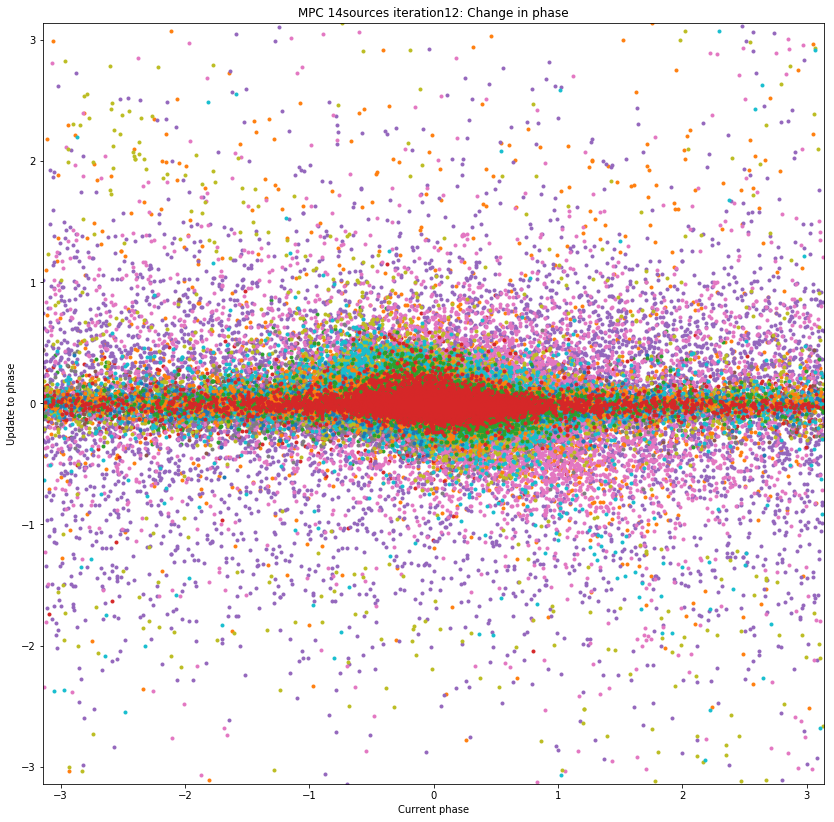

Iteration 13
arlexecute.compute: Execution using Dask took 47.397 seconds
arlexecute.compute: Execution using Dask took 41.175 seconds
arlexecute.compute: Execution using Dask took 45.413 seconds
Peak residual : 0.10759242089842916
arlexecute.compute: Execution using Dask took 8.376 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.040742744563093125'
		min: '-0.01595174001630325'
		rms: '1.796628384962295e-05'
		sum: '0.20004861297829257'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.139 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00790258324138924'
		min: '-0.0076314263319172525'
		rms: '1.033497363561094e-05'
		sum: '0.20375107851829122'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.319 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 

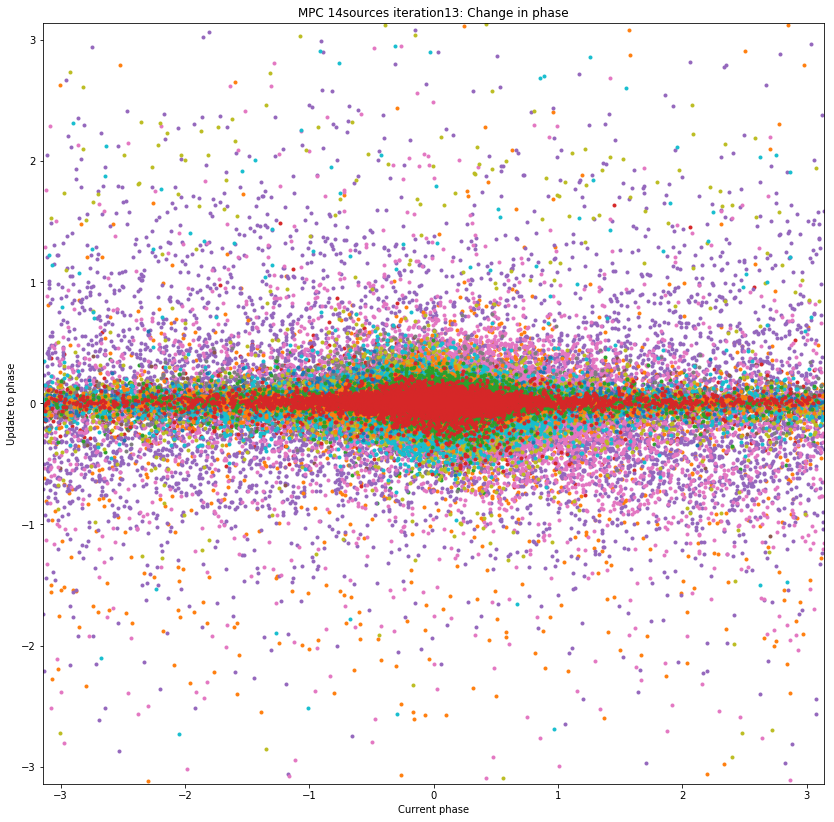

Iteration 14
arlexecute.compute: Execution using Dask took 47.595 seconds
arlexecute.compute: Execution using Dask took 41.124 seconds
arlexecute.compute: Execution using Dask took 45.812 seconds
Peak residual : 0.09641108708970636
arlexecute.compute: Execution using Dask took 8.255 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.009209076462609316'
		min: '-0.00977980934739749'
		rms: '1.4688613442933282e-05'
		sum: '-0.006165507417578131'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.383 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.013685876830945057'
		min: '-0.009999933200550254'
		rms: '1.1193420186742135e-05'
		sum: '0.07005943988316636'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.203 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1,

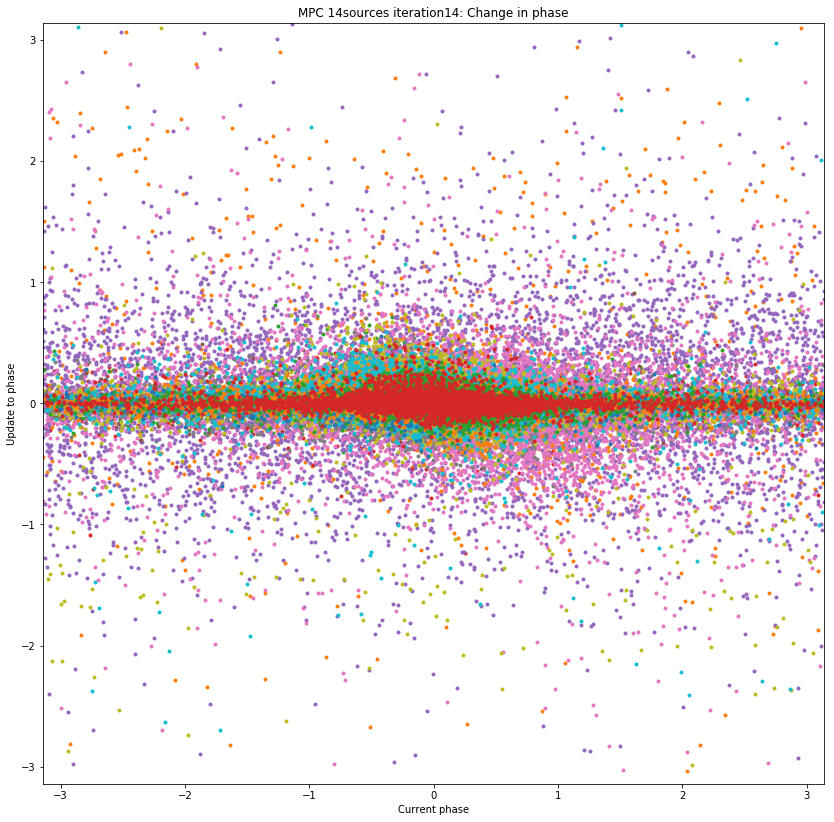

Iteration 15
arlexecute.compute: Execution using Dask took 47.399 seconds
arlexecute.compute: Execution using Dask took 40.957 seconds
arlexecute.compute: Execution using Dask took 45.378 seconds
Peak residual : 0.09969845369980089
arlexecute.compute: Execution using Dask took 7.671 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.014794209781860619'
		min: '-0.00440665578012316'
		rms: '5.94322308987059e-06'
		sum: '0.062382648534674165'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.074 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.009099106207540153'
		min: '-0.006977730566237548'
		rms: '7.3913972835683266e-06'
		sum: '0.018900085345665313'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.819 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1

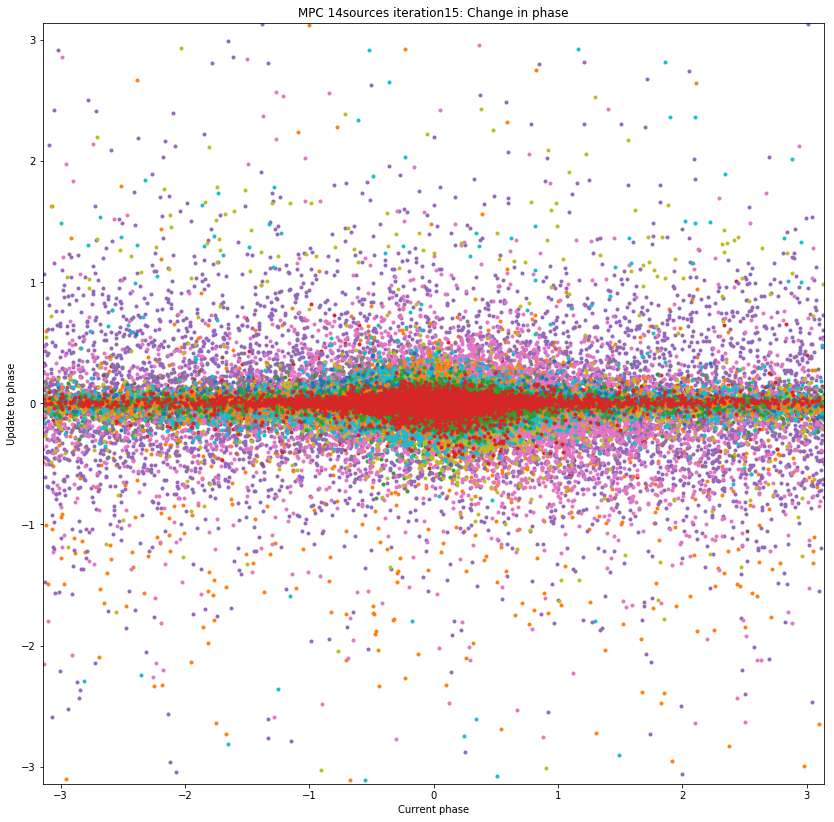

Iteration 16
arlexecute.compute: Execution using Dask took 47.734 seconds
arlexecute.compute: Execution using Dask took 41.419 seconds
arlexecute.compute: Execution using Dask took 45.732 seconds
Peak residual : 0.09270238882622811
arlexecute.compute: Execution using Dask took 7.765 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004148379567876659'
		min: '-0.004096051812110675'
		rms: '6.24347795985284e-06'
		sum: '0.027838104949559933'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.994 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.008400984568066023'
		min: '-0.005926383790237267'
		rms: '7.232929426152411e-06'
		sum: '0.00029258205122228233'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.904 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1,

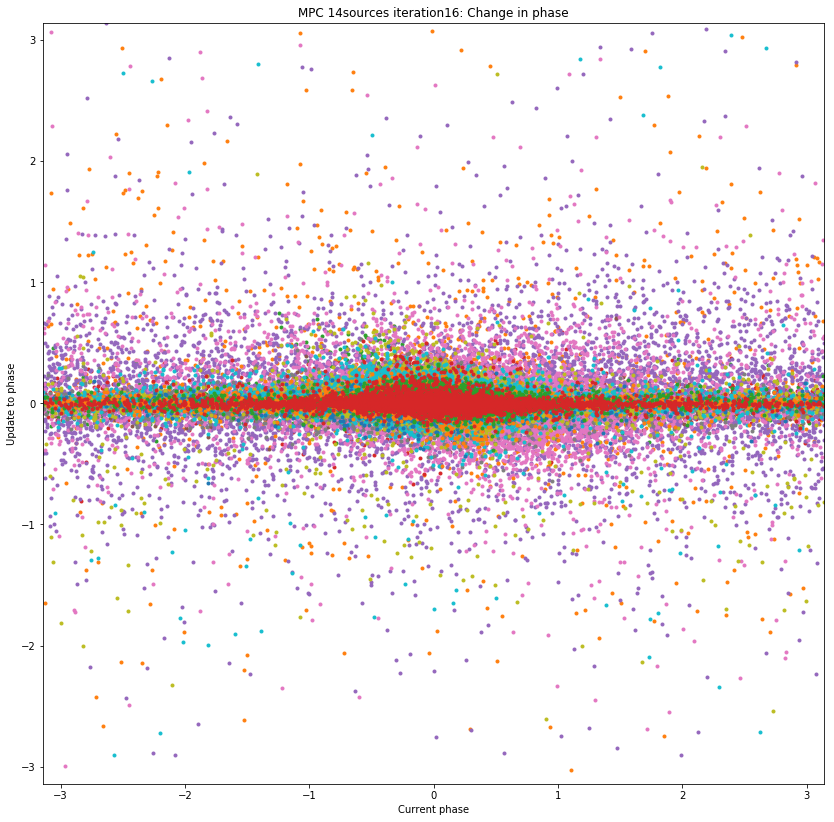

Iteration 17
arlexecute.compute: Execution using Dask took 47.858 seconds
arlexecute.compute: Execution using Dask took 41.407 seconds
arlexecute.compute: Execution using Dask took 45.988 seconds
Peak residual : 0.09955187969551564
arlexecute.compute: Execution using Dask took 7.154 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004396666086965891'
		min: '-0.004208696420557825'
		rms: '2.718358951709785e-06'
		sum: '0.008029203890421608'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.221 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0034010826388761544'
		min: '-0.003272372546956678'
		rms: '2.3869529539375504e-06'
		sum: '-0.010278471525088779'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.152 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(

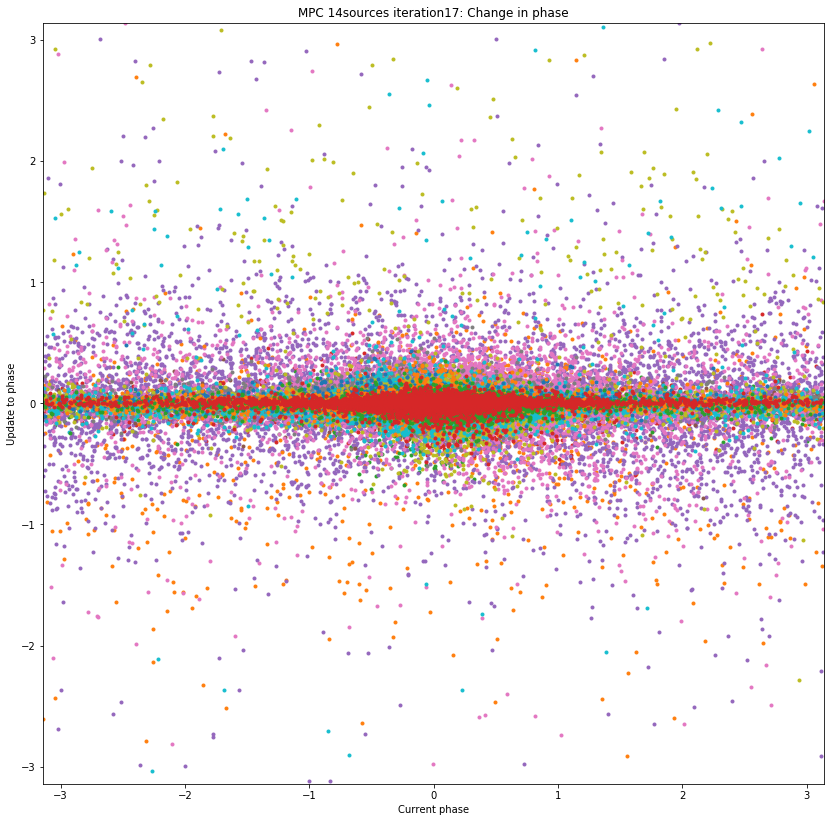

Iteration 18
arlexecute.compute: Execution using Dask took 47.773 seconds
arlexecute.compute: Execution using Dask took 41.246 seconds
arlexecute.compute: Execution using Dask took 45.854 seconds
Peak residual : 0.0906822524498298
arlexecute.compute: Execution using Dask took 7.337 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003943013340854011'
		min: '-0.004005341433240583'
		rms: '4.830704228342495e-06'
		sum: '0.09587316255870633'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.989 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004099109024848901'
		min: '-0.003945052414441634'
		rms: '5.828397299803775e-06'
		sum: '0.01381571800655701'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.105 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1, 

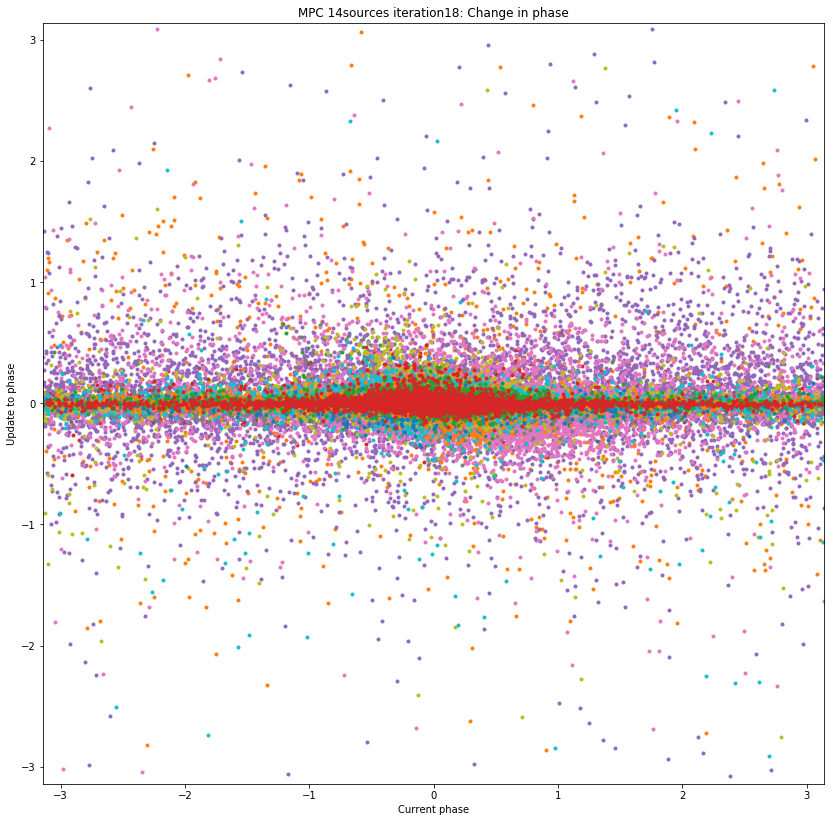

Iteration 19
arlexecute.compute: Execution using Dask took 47.482 seconds
arlexecute.compute: Execution using Dask took 41.145 seconds
arlexecute.compute: Execution using Dask took 45.675 seconds
Peak residual : 0.09544726121987025
arlexecute.compute: Execution using Dask took 6.981 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004061786131332749'
		min: '-0.004180847411245636'
		rms: '2.993053602471657e-06'
		sum: '-0.01152159907193015'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.451 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004164218145672125'
		min: '-0.004112407909807991'
		rms: '3.773240193321835e-06'
		sum: '-0.020244706462618056'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.852 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1,

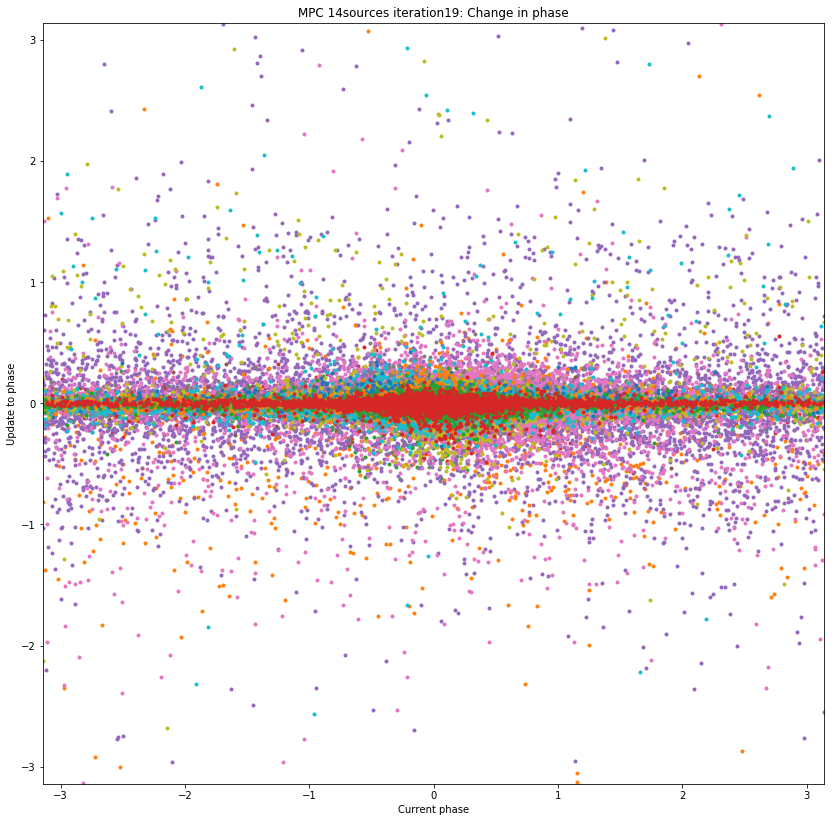

Iteration 20
arlexecute.compute: Execution using Dask took 47.938 seconds
arlexecute.compute: Execution using Dask took 41.347 seconds
arlexecute.compute: Execution using Dask took 46.431 seconds
Peak residual : 0.08933643133980587
arlexecute.compute: Execution using Dask took 7.254 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0038730204000447382'
		min: '-0.003894455650436721'
		rms: '5.532514237391284e-06'
		sum: '-0.026110689510699104'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.056 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.007877007056068329'
		min: '-0.0038372848987710735'
		rms: '5.692022891997339e-06'
		sum: '0.053766048076424926'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.736 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(

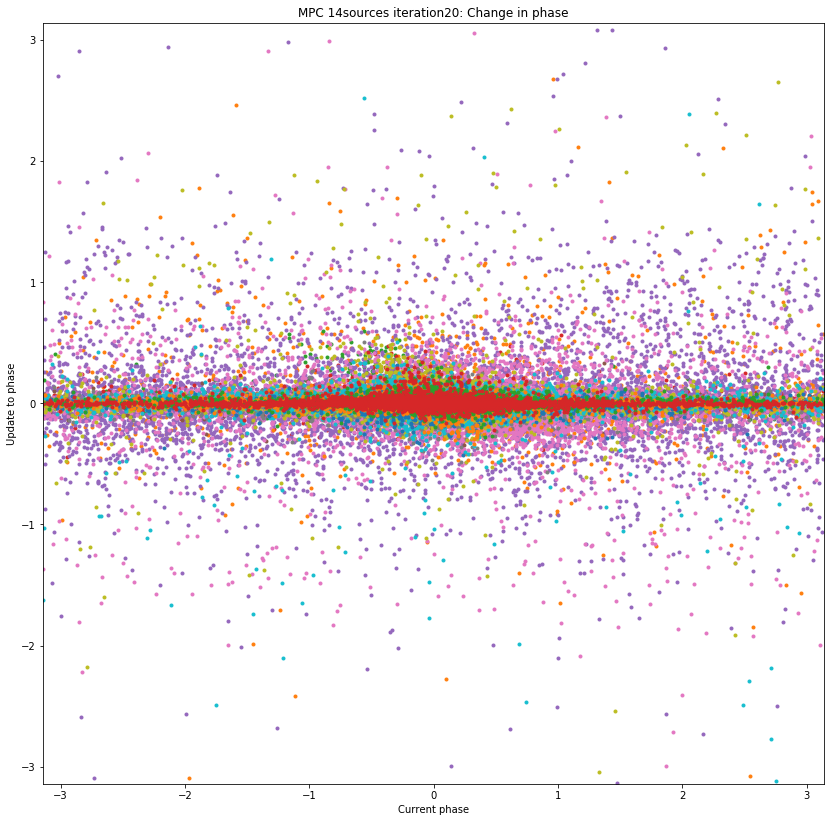

Iteration 21
arlexecute.compute: Execution using Dask took 47.872 seconds
arlexecute.compute: Execution using Dask took 41.200 seconds
arlexecute.compute: Execution using Dask took 46.090 seconds
Peak residual : 0.09127228719427255
arlexecute.compute: Execution using Dask took 7.376 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003947221073553524'
		min: '-0.003952485171988478'
		rms: '4.119589708969139e-06'
		sum: '0.014544602094949179'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.184 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.007339159759926186'
		min: '-0.003957652855718725'
		rms: '4.024807146668745e-06'
		sum: '-0.0158092181257762'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.115 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1, 1

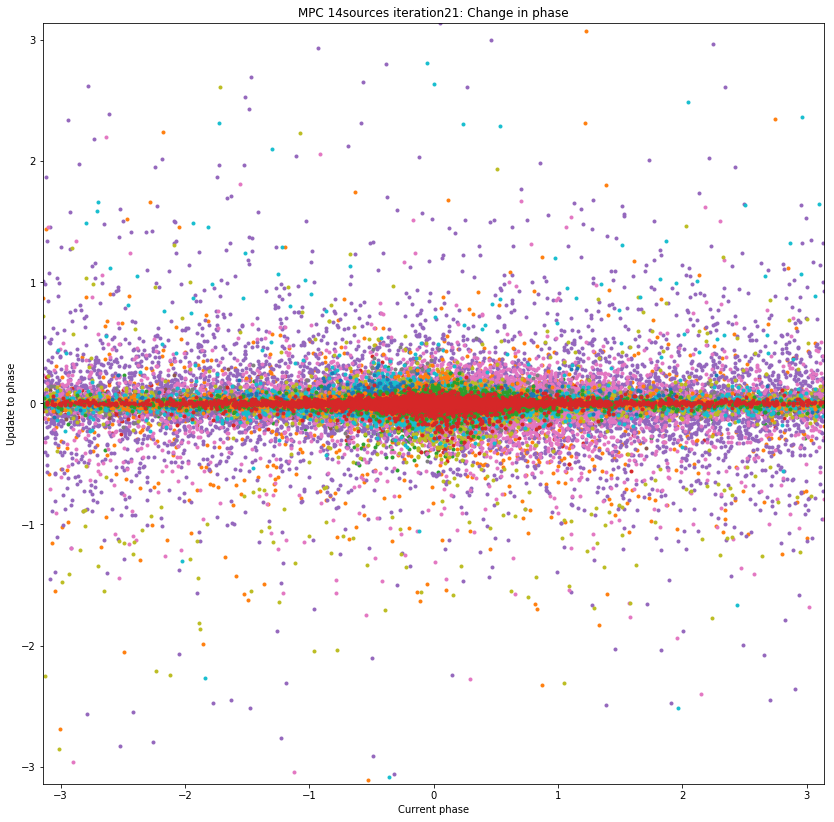

Iteration 22
arlexecute.compute: Execution using Dask took 47.617 seconds
arlexecute.compute: Execution using Dask took 40.953 seconds
arlexecute.compute: Execution using Dask took 46.663 seconds
Peak residual : 0.08779462517600131
arlexecute.compute: Execution using Dask took 8.005 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0038223951010446186'
		min: '-0.003858409887700021'
		rms: '4.376839283042199e-06'
		sum: '0.04863807929627197'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.288 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003907986984501576'
		min: '-0.0038554382880884954'
		rms: '4.639050989913265e-06'
		sum: '0.007148170797390534'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.660 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1,

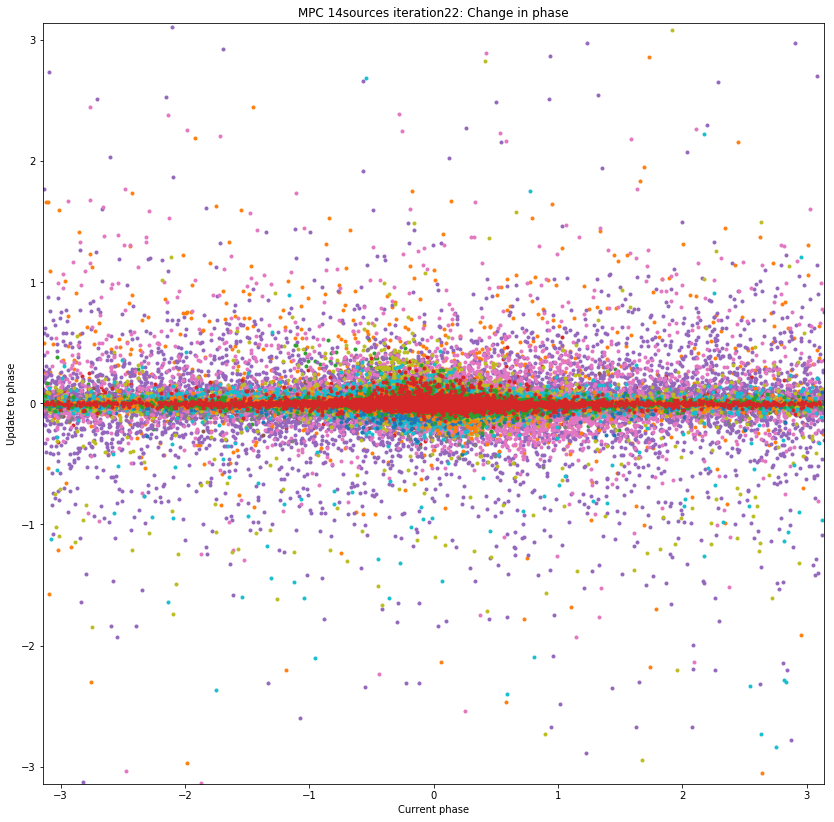

Iteration 23
arlexecute.compute: Execution using Dask took 48.261 seconds
arlexecute.compute: Execution using Dask took 41.609 seconds
arlexecute.compute: Execution using Dask took 45.824 seconds
Peak residual : 0.09263192543922574
arlexecute.compute: Execution using Dask took 7.251 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00394442697579643'
		min: '-0.003757946845718271'
		rms: '3.0769549107129447e-06'
		sum: '0.007448897132544459'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.296 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004031504775882416'
		min: '-0.0039038944382520225'
		rms: '2.4870153340121354e-06'
		sum: '0.031782692416970425'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.158 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1

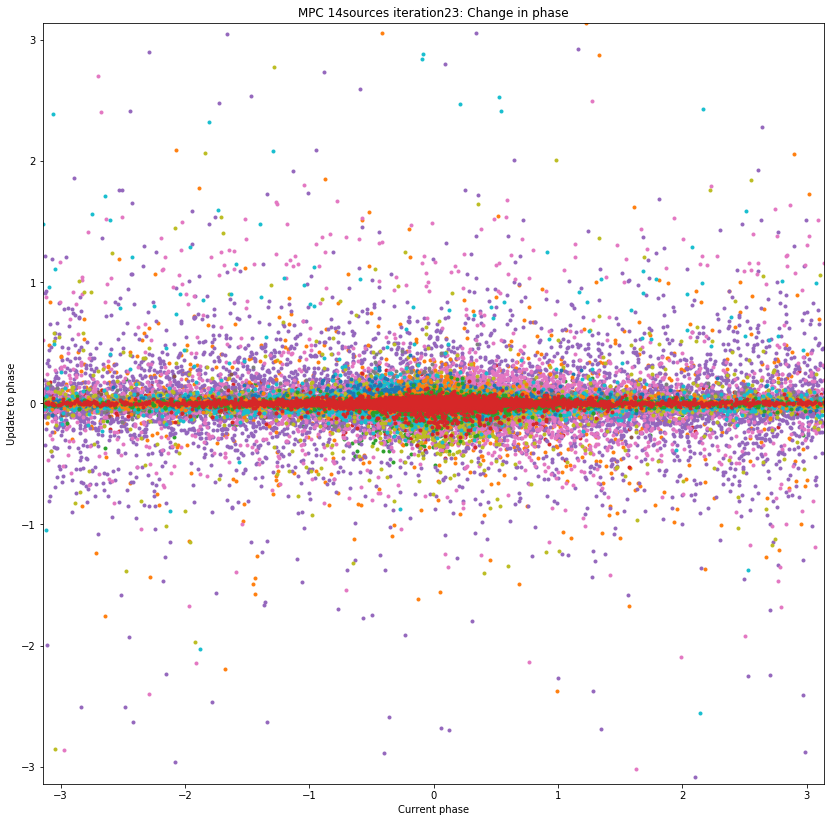

Iteration 24
arlexecute.compute: Execution using Dask took 47.961 seconds
arlexecute.compute: Execution using Dask took 41.416 seconds
arlexecute.compute: Execution using Dask took 46.068 seconds
Peak residual : 0.08905820438028753
arlexecute.compute: Execution using Dask took 7.000 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003786574639962655'
		min: '-0.0037477844007396525'
		rms: '2.7075211442787572e-06'
		sum: '0.042163457174969325'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.908 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003778935681535282'
		min: '-0.0028361503700733617'
		rms: '2.7581628704060586e-06'
		sum: '0.01969175173241502'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.054 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(

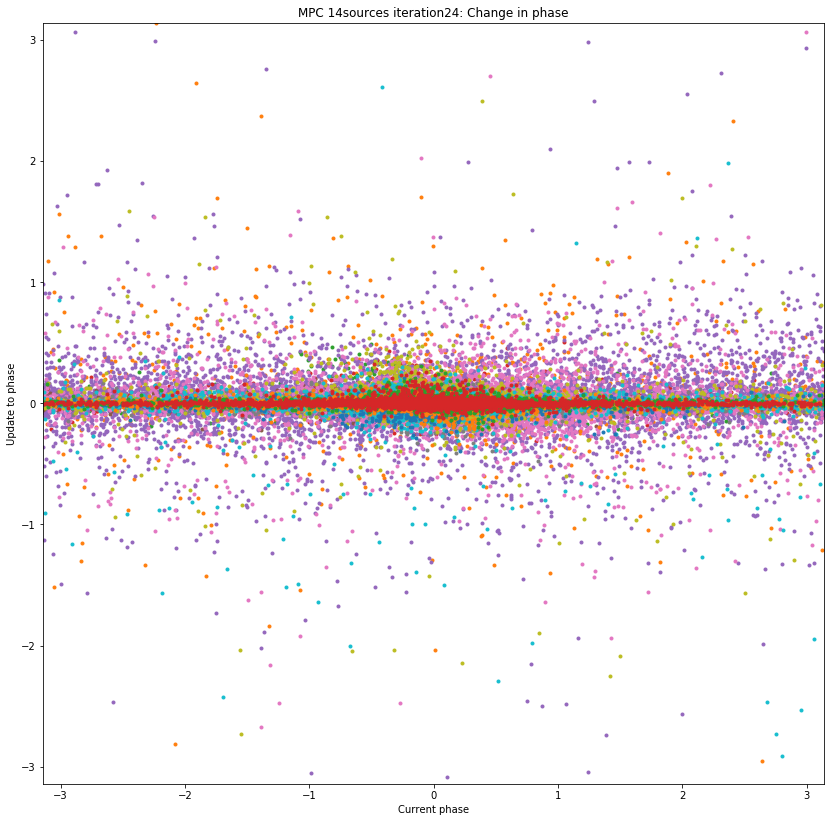

Iteration 25
arlexecute.compute: Execution using Dask took 48.144 seconds
arlexecute.compute: Execution using Dask took 41.189 seconds
arlexecute.compute: Execution using Dask took 45.776 seconds
Peak residual : 0.09296637211227178
arlexecute.compute: Execution using Dask took 7.080 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0036679229316151987'
		min: '-0.003547565173601213'
		rms: '1.8340088406107675e-06'
		sum: '0.004645848066219047'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.823 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0030349348944379486'
		min: '-0.003859842807435211'
		rms: '2.016873645168652e-06'
		sum: '0.00853332948870825'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.982 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '(1

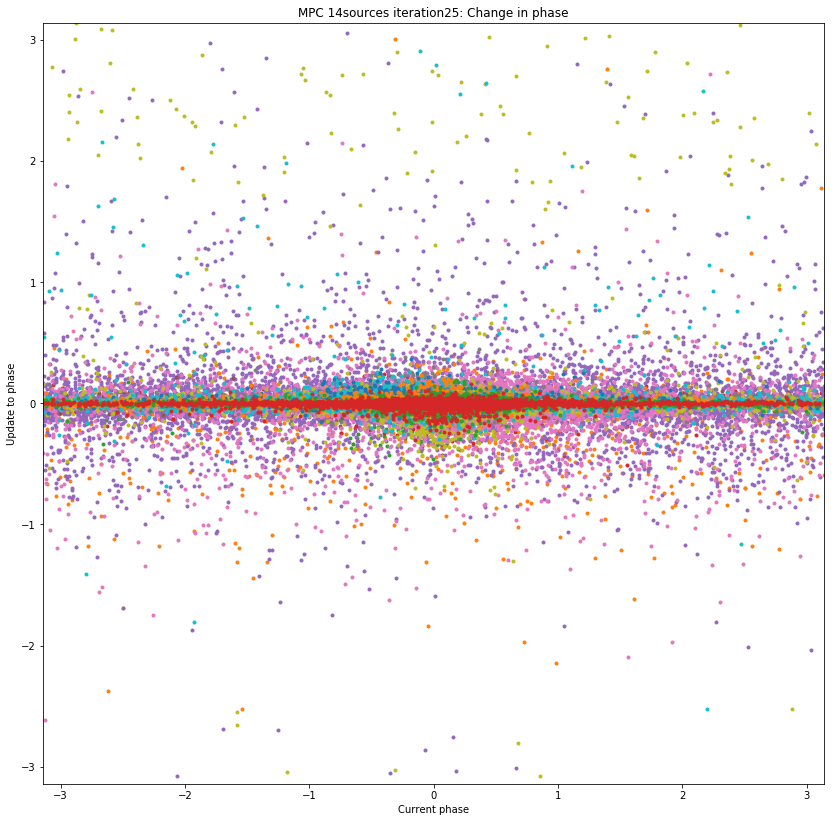

Iteration 26
arlexecute.compute: Execution using Dask took 46.908 seconds
arlexecute.compute: Execution using Dask took 41.645 seconds
arlexecute.compute: Execution using Dask took 45.794 seconds
Peak residual : 0.0915561721418161
arlexecute.compute: Execution using Dask took 7.198 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0002688064091995689'
		min: '-0.0038292607251568392'
		rms: '1.571268070995641e-06'
		sum: '-0.007819487684755936'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.132 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00394862972271829'
		min: '-0.0038130857489136858'
		rms: '2.2328815258156254e-06'
		sum: '-6.15238846855036e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.280 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '

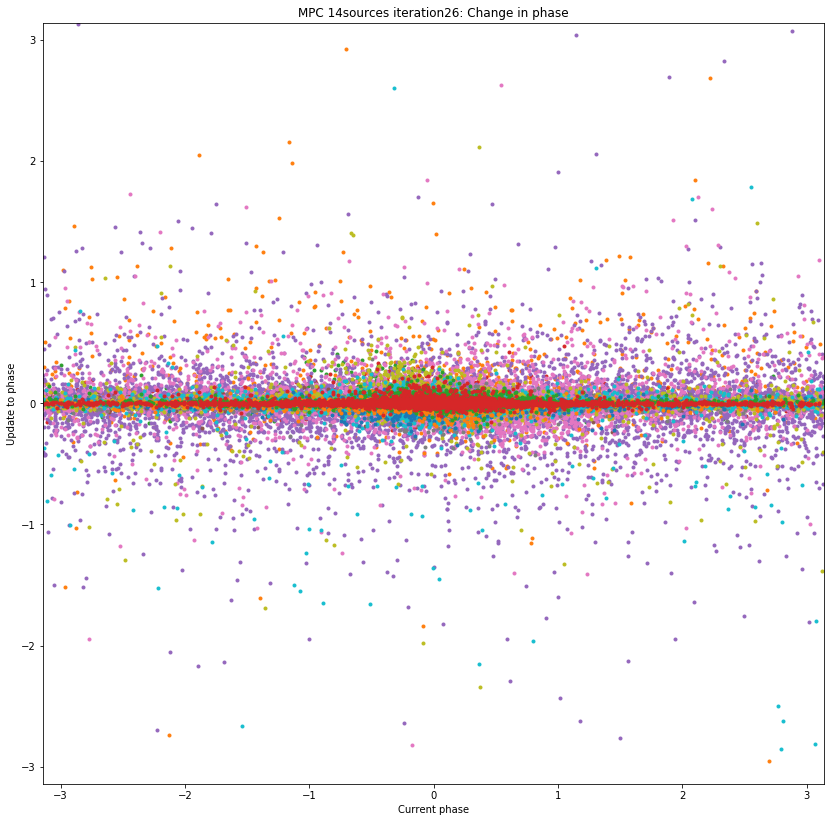

Iteration 27
arlexecute.compute: Execution using Dask took 47.740 seconds
arlexecute.compute: Execution using Dask took 41.529 seconds
arlexecute.compute: Execution using Dask took 45.615 seconds
Peak residual : 0.09334156679199018
arlexecute.compute: Execution using Dask took 7.094 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0002746143834479417'
		min: '-0.0029258876786157403'
		rms: '8.131320716475748e-07'
		sum: '0.0038702854942006377'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.129 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003986637407414059'
		min: '-0.002845284989235466'
		rms: '1.6430028371007353e-06'
		sum: '0.003772370974656527'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.823 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape: '

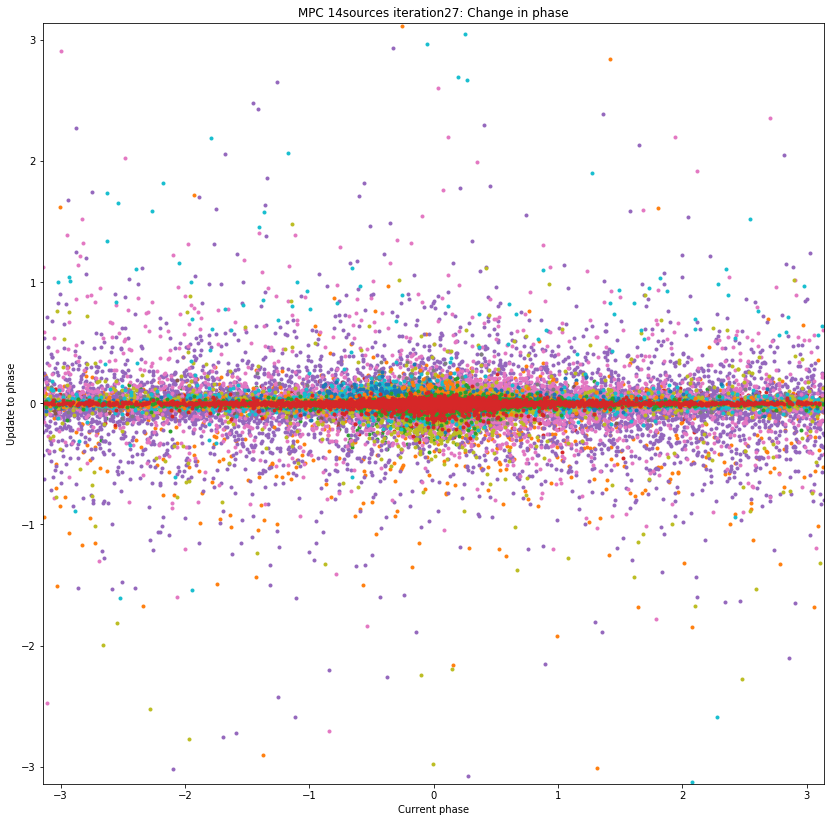

Iteration 28
arlexecute.compute: Execution using Dask took 48.439 seconds
arlexecute.compute: Execution using Dask took 41.430 seconds
arlexecute.compute: Execution using Dask took 46.080 seconds
Peak residual : 0.09322618415008055
arlexecute.compute: Execution using Dask took 7.556 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0039082829598654145'
		min: '-0.0029924664843625597'
		rms: '1.289092960163215e-06'
		sum: '-4.105513992446976e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.871 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003806061986138826'
		min: '-0.002941215618434242'
		rms: '1.773077443907451e-06'
		sum: '-0.00013785966793255505'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.805 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 2
	Data:
		shape

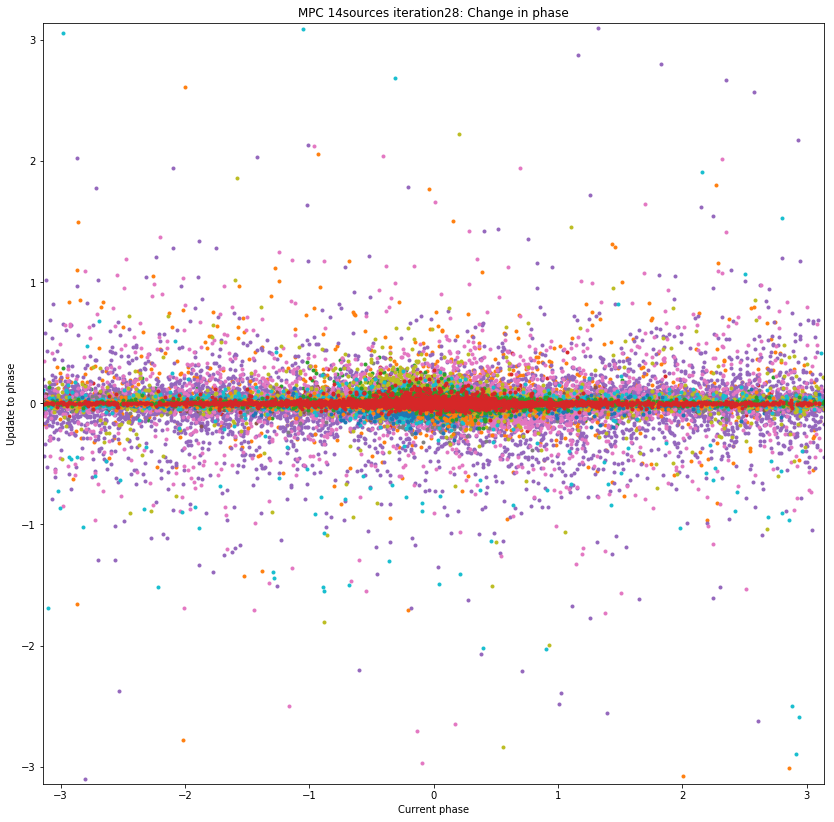

Iteration 29
arlexecute.compute: Execution using Dask took 49.125 seconds


In [ ]:
nsources=14
iteration=0
rmax=10000.0
theta_list = import_skymodel_from_hdf5("results/mpc-skymodel_%dsources_iteration%d_rmax%.1f.hdf5" % 
                                       (nsources, iteration, rmax))
model = copy_image(theta_list[0].image)
model.data[...] = 0.0

psf_obs = invert_list_arlexecute_workflow([Vobs], [model], context='2d', dopsf=True)
psf_obs = arlexecute.compute(psf_obs, sync=True)

for iteration in range(1,30):

    print('Iteration %d' % iteration)

    future_Vobs = arlexecute.scatter(Vobs)
    Vdatamodel_list = predict_skymodel_list_arlexecute_workflow(future_Vobs, theta_list, context='2d', docal=True)
    Vdatamodel_list = extract_datamodels_skymodel_list_arlexecute_workflow(future_Vobs, Vdatamodel_list)
    Vdatamodel_list = arlexecute.compute(Vdatamodel_list, sync=True)
    

    dirty_all_conv = convolve_skymodel_list_arlexecute_workflow(future_Vobs, theta_list, context='2d', docal=True)
    dirty_all_conv = arlexecute.compute(dirty_all_conv, sync=True)    
    dirty_all_cal = invert_skymodel_list_arlexecute_workflow(Vdatamodel_list, theta_list, context='2d', docal=True)
    dirty_all_cal = arlexecute.compute(dirty_all_cal, sync=True)
    
    for i, d in enumerate(dirty_all_cal):
        d[0].data -= dirty_all_conv[i][0].data
        
    peak = 0.0
    combined_dirty_image=copy_image(model)
    combined_dirty_image.data[...]=0.0
    for i, d in enumerate(dirty_all_cal):
        peak = max(peak, numpy.max(numpy.abs(d[0].data)))
        combined_dirty_image.data+=d[0].data
    print("Peak residual :", peak)
    
    for ism, sm in enumerate(theta_list):
        deconvolved_list, _ = deconvolve_list_arlexecute_workflow([dirty_all_cal[ism]], [psf_obs[0]], 
                                                          [model], mask=sm.mask, algorithm='msclean',
                                                              scales=[0,3,10],                                                          niter=100,
                                                          fractional_threshold=0.3, threshold=0.3 * peak,
                                                          gain=0.1, 
                                                          psf_support=128, deconvolve_facets=8,
                                                             deconvolve_overlap=16,
                                                             deconvolve_taper='tukey')

        deconvolved_list = arlexecute.compute(deconvolved_list, sync=True)
        print(qa_image(deconvolved_list[0], context='skymodel %d'%ism))
        sm.image.data += sm.mask.data * deconvolved_list[0].data
        
    combined_model = calculate_skymodel_equivalent_image(theta_list)
    print(qa_image(combined_model, context='Combined model'))
    
    Vpredicted_list = predict_skymodel_list_arlexecute_workflow(future_Vobs, theta_list, context='2d', docal=True)
    result = calibrate_list_arlexecute_workflow(Vdatamodel_list, Vpredicted_list,
                                            calibration_context='T',
                                            iteration=0, global_solution=False)
    Vcalibrated, gaintable_list = arlexecute.compute(result, sync=True)
    
    plt.clf()
    for i in range(len(theta_list)):
        plt.plot(numpy.angle(theta_list[i].gaintable.gain[:,:,0,0,0]).flatten(),
                 numpy.angle(gaintable_list[i]['T'].gain[:,:,0,0,0]).flatten(), 
                 '.')
    plt.xlabel('Current phase')
    plt.ylabel('Update to phase')
    plt.xlim([-numpy.pi, numpy.pi])
    plt.ylim([-numpy.pi, numpy.pi])
    plt.title("MPC %dsources iteration%d: Change in phase" % (nsources, iteration))
    plt.savefig("figures/mpc-skymodel-phase-change_%dsources_iteration%d.jpg" % (nsources, iteration))
    plt.show()
    
    theta_list = update_skymodel_from_gaintables(theta_list, gaintable_list, calibration_context='T') 
    
    export_skymodel_to_hdf5(theta_list, "results/mpc-skymodel_%dsources_iteration%d_rmax%.1f.hdf5" % (nsources, iteration, rmax))

In [ ]:
export_image_to_fits(combined_model, 'results/low-mpc_%dsources-deconvolved.fits' % nsources)

In [ ]:
from workflows.arlexecute.imaging.imaging_arlexecute import restore_list_arlexecute_workflow
result=restore_list_arlexecute_workflow([combined_model], psf_obs, [(combined_dirty_image, 0.0)])

In [ ]:
result=arlexecute.compute(result, sync=True)

In [ ]:
print(qa_image(result[0], context='MPC restored image'))

In [ ]:
recovered_mpccal_components = find_skycomponents(result[0], fwhm=2, threshold=0.14, npixels=12)
print(len(recovered_mpccal_components))
print(recovered_mpccal_components[0])
from data_models.data_model_helpers import export_skycomponent_to_hdf5
export_skycomponent_to_hdf5(recovered_mpccal_components, 'results/low-mpc_%dsources-components.hdf5' % nsources)


In [ ]:
show_image(result[0], vmax=0.3, vmin=-0.03, components=recovered_mpccal_components)
export_image_to_fits(result[0], 'low-mpc_%dsources-restored.fits' % nsources)
plt.show()

In [ ]:
from data_models.data_model_helpers import import_skymodel_from_hdf5
gleam_skymodel_iso=import_skymodel_from_hdf5('results/low-sims-mpc-iso-skymodel_rmax%.1f.hdf5' % rmax)
from processing_components.skycomponent.operations import filter_skycomponents_by_flux
bright_gleam=filter_skycomponents_by_flux(gleam_skymodel_iso.components, flux_min=0.4)
def max_flux(elem):
    return numpy.max(elem.flux)
sorted_bright_gleam=sorted(bright_gleam, key=max_flux, reverse=True)

from wrappers.serial.skycomponent.operations import find_skycomponent_matches
matches = find_skycomponent_matches(recovered_mpccal_components, sorted_bright_gleam, tol=1e-3)
x=list()
y=list()
dx=list()
dy=list()
for match in matches:
    y.append(recovered_mpccal_components[match[0]].flux[0,0])
    x.append(sorted_bright_gleam[match[1]].flux[0,0])
    dx.append(recovered_mpccal_components[match[0]].direction.ra.rad-sorted_bright_gleam[match[1]].direction.ra.rad)
    dy.append(recovered_mpccal_components[match[0]].direction.dec.rad-sorted_bright_gleam[match[1]].direction.dec.rad)
        
plt.clf()
plt.plot(x, y, '.')
plt.xlim([0.0, 5.5])
plt.ylim([0.0, 5.5])
plt.xlabel('Input component flux')
plt.ylabel('Recovered component flux')
plt.title('Non-isoplanatic MPC %d sources case: flux recovered' % nsources)
plt.savefig('mpccal_noniso_%dsources_flux_errors.jpg' % nsources)
plt.show()
    
plt.clf()
plt.plot(dx, dy, '.')
plt.xlim([-1e-3, 1e-3])
plt.ylim([-1e-3, 1e-3])
plt.xlabel('Error in RA (rad)')
plt.ylabel('Error in Dec (rad)')
plt.title('Non-isoplanatic MPC %d sources case: position error' % nsources)
plt.savefig('mpccal_noniso_%dsources_position_errors.jpg' % nsources)
plt.show()
    

In [ ]:
oldscreen=import_image_from_fits('screens/low_screen_5000.0r0_0.100rate.fits')
from processing_components.simulation.ionospheric_screen import grid_gaintable_to_screen
from processing_components.image.operations import create_empty_image_like
newscreen = create_empty_image_like(oldscreen)
gaintables = [th.gaintable for th in theta_list]
newscreen, weights = grid_gaintable_to_screen(blockvis, gaintables, newscreen)
print(qa_image(newscreen))
export_image_to_fits(newscreen, 'results/mpccal_%dsources_screen.fits' % nsources)
export_image_to_fits(weights, 'results/mpccal_%dsources_screen_weights.fits' % nsources)

In [ ]:
arlexecute.close()